In [33]:
import pandas as pd
import seaborn as sns
from urllib.request import urlopen
import json
import plotly.express as px

In [34]:
# solving the encoding problem
import chardet
with open("Pysakointivirheet_2014-17.csv", 'rb') as rawdata:
    result = chardet.detect(rawdata.read(100000))
result

{'encoding': 'ISO-8859-1', 'confidence': 0.7296934, 'language': ''}

In [35]:
data = pd.read_csv("Pysakointivirheet_2014-17.csv", encoding='ISO-8859-1',  converters={'Postinumero': str}) # Load the data
#data['Year'] = pd.DatetimeIndex(data['Date']).year # Create year variable
#data = data.drop(data[data['Year']==2018].index) # Drop 2018 data, as this year is incomplete


In [36]:
df = data.copy()
df

,Virheen tekokuukausi,Virheen tekovuosi,Osoite,Virhemaksun vaihe,Virheen pääluokka / pääsyy,Virheen kirjaaja,y,x,Postinumero,Postitoimipaikka,Alue,Kunta,Kunta_nro
0,Elokuu,2016,NaN,Pysäköintivirhemaksu,1700 Luvaton maastopysäköinti,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
1,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
2,Elokuu,2016,NaN,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
3,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
4,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
644896,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0
644897,Maaliskuu,2014,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0
644898,Marraskuu,2015,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0
644899,Kesäkuu,2017,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0


In [37]:
df = df.reset_index()
df = df.rename(columns={"index": "Tickets", "Virheen tekokuukausi" : "Month", "Virheen tekovuosi" : "Year", "Osoite" : "Address", "Virhemaksun vaihe" : "Fine type", "Virheen pääluokka / pääsyy" : "Type of offence", "Virheen kirjaaja" : "Fine issuer", "Postinumero": "Postal code", "Postitoimipaikka": "Postal district", "Alue": "Area", "Kunta": "Municipality", "Kunta_nro": "Municipality number"  })
df

,Tickets,Month,Year,Address,Fine type,Type of offence,Fine issuer,y,x,Postal code,Postal district,Area,Municipality,Municipality number
0,0,Elokuu,2016,NaN,Pysäköintivirhemaksu,1700 Luvaton maastopysäköinti,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
1,1,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
2,2,Elokuu,2016,NaN,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
3,3,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
4,4,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644896,644896,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0
644897,644897,Maaliskuu,2014,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0
644898,644898,Marraskuu,2015,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0
644899,644899,Kesäkuu,2017,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0


In [38]:
# create empty column 'Month number'
df['Month number'] = df.apply(lambda _: '', axis=1)

In [39]:
# creating month number
df.loc[df.Month == 'Tammikuu', 'Month number'] = "1"
df.loc[df.Month == 'Helmikuu', 'Month number'] = "2"
df.loc[df.Month == 'Maaliskuu', 'Month number'] = "3"
df.loc[df.Month == 'Huhtikuu', 'Month number'] = "4"
df.loc[df.Month == 'Toukokuu', 'Month number'] = "5"
df.loc[df.Month == 'Kesäkuu', 'Month number'] = "6"
df.loc[df.Month == 'Heinäkuu', 'Month number'] = "7"
df.loc[df.Month == 'Elokuu', 'Month number'] = "8"
df.loc[df.Month == 'Syyskuu', 'Month number'] = "9"
df.loc[df.Month == 'Lokakuu', 'Month number'] = "10"
df.loc[df.Month == 'Marraskuu', 'Month number'] = "11"
df.loc[df.Month == 'Joulukuu', 'Month number'] = "12"
df

,Tickets,Month,Year,Address,Fine type,Type of offence,Fine issuer,y,x,Postal code,Postal district,Area,Municipality,Municipality number,Month number
0,0,Elokuu,2016,NaN,Pysäköintivirhemaksu,1700 Luvaton maastopysäköinti,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN,8
1,1,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN,8
2,2,Elokuu,2016,NaN,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN,8
3,3,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN,8
4,4,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644896,644896,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0,6
644897,644897,Maaliskuu,2014,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0,3
644898,644898,Marraskuu,2015,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0,11
644899,644899,Kesäkuu,2017,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0,6


In [40]:
print("Total number of parking violations between 2014-2017 in Helsinki:", df['Month'].count()) #We don't want to calculate the row with headers

Total number of parking violations between 2014-2017 in Helsinki: 644901


In [41]:
df[(df['Year'] == 2014)].count()

Tickets                164054
Month                  164054
Year                   164054
Address                164054
Fine type              164054
Type of offence        164049
Fine issuer            164054
y                      164054
x                      164054
Postal code            164054
Postal district        164054
Area                   164054
Municipality           164054
Municipality number    164054
Month number           164054
dtype: int64

In [42]:
df['Year']

0         2016
1         2016
2         2016
3         2016
4         2016
          ... 
644896    2014
644897    2014
644898    2015
644899    2017
644900    2017
Name: Year, Length: 644901, dtype: int64

In [43]:
df.columns

Index(['Tickets', 'Month', 'Year', 'Address', 'Fine type', 'Type of offence',
       'Fine issuer', 'y', 'x', 'Postal code', 'Postal district', 'Area',
       'Municipality', 'Municipality number', 'Month number'],
      dtype='object')

In [44]:
df[(df['Postal code'] == "00260")].count()

Tickets                14165
Month                  14165
Year                   14165
Address                14165
Fine type              14165
Type of offence        14163
Fine issuer            14165
y                      14165
x                      14165
Postal code            14165
Postal district        14165
Area                   14165
Municipality           14165
Municipality number    14165
Month number           14165
dtype: int64

In [45]:
df['Postal code'].unique()

array(['', '00560', '00500', '00750', '00840', '00720', '00940', '00970',
       '00810', '00880', '00180', '00960', '00570', '00400', '00530',
       '00790', '00950', '01420', '00320', '00800', '00780', '00650',
       '00100', '00980', '00830', '00390', '00770', '00440', '00700',
       '00920', '00730', '00150', '00120', '00710', '00170', '00510',
       '00520', '00660', '00580', '00160', '00550', '00610', '00350',
       '00540', '00600', '00330', '00240', '00410', '00130', '00900',
       '00370', '00990', '00250', '00620', '00690', '00930', '00300',
       '00220', '00890', '00740', '00260', '00140', '00430', '00680',
       '00420', '00850', '00590', '00870', '00200', '00910', '00290',
       '00630', '00280', '00760', '00640', '00210', '00501', '00340',
       '00380', '00270', '00670', '00820', '00310', '01260', '002230',
       '00360', '00230', '00860', '00631', '00632'], dtype=object)

In [46]:
df['Area'].unique()

array([nan, 'Toukola-Vanhakaupunk', 'Sörnäinen', 'Puistola', 'Laajasalo',
       'Pukinmäki-Savela', 'Kontula', 'Mellunkylä', 'Herttoniemi',
       'Roihupellon teollisu', 'Ruoholahti', 'Pohjois-Vuosaari',
       'Kulosaari', 'Pohjois-Haaga', 'Kallio', 'Viikki', 'Vartioharju',
       'Päiväkumpu', 'Etelä-Haaga', 'Länsi-Herttoniemi', 'Tapaninvainio',
       'Veräjämäki', 'Helsinki Keskusta', 'Etelä-Vuosaari', 'Tammisalo',
       'Konala', 'Jakomäki', 'Lassila', 'Malmi', 'Myllypuro', 'Tapanila',
       'Eira', 'Punavuori', 'Pihlajamäki', 'Kruununhaka', 'Etu-Vallila',
       'Itä-Pasila', 'Länsi-Pakila', 'Verkkosaari', 'Katajanokka',
       'Vallila', 'Käpylä', 'Munkkivuori-Niemenmä', 'Kalasatama',
       'Koskela-Helsinki', 'Munkkiniemi', 'Länsi-Pasila', 'Malminkartano',
       'Kaartinkaupunki', 'Puotinharju', 'Reimarla', 'Aurinkolahti',
       'Taka-Töölö', 'Metsälä-Etelä-Oulunk', 'Tuomarinkylä-Torppar',
       'Itäkeskus-Marjaniemi', 'Pikku Huopalahti', 'Jätkäsaari',
       'Itäsalmi'

In [47]:
df['Fine type'].value_counts()

Pysäköintivirhemaksu    615692
Huomautus                29209
Name: Fine type, dtype: int64

In [48]:
#Change the order of the values so the ascend with the years
df['Year'].value_counts().sort_index(ascending=True)

2014    164054
2015    150218
2016    166380
2017    164249
Name: Year, dtype: int64

<AxesSubplot: title={'center': 'crimes-per-year'}, xlabel='Years', ylabel='crime-counts'>

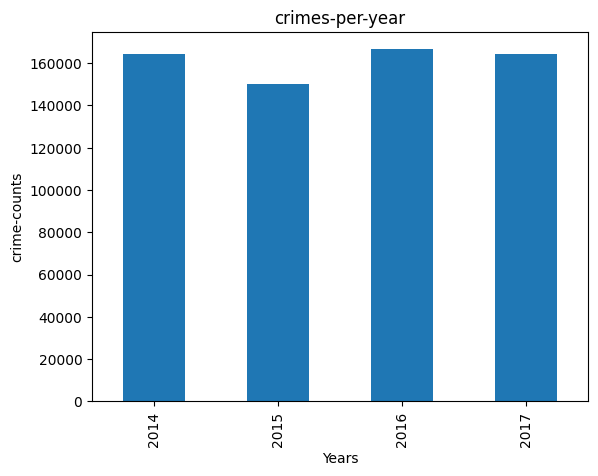

In [49]:
#barplot of crimes-per-year (years on the -axis, crime-counts on the -axis).
df['Year'].value_counts().sort_index(ascending=True).plot.bar(title='crimes-per-year', xlabel='Years', ylabel='crime-counts')

# Monthly barchart

In [50]:
# Seaborne requires data in the format as specified below
# where data is aggregated as a count of "IncidntNum" in data frame grouped by "Category" and "Day" 
# (in the case of weekdays) and the index is reset
pd.DataFrame(df.groupby(["Month"])["Tickets"].count()).reset_index(drop=False)

,Month,Tickets
0,Elokuu,55685
1,Heinäkuu,44887
2,Helmikuu,51464
3,Huhtikuu,53736
4,Joulukuu,45756
5,Kesäkuu,51018
6,Lokakuu,60388
7,Maaliskuu,59600
8,Marraskuu,58108
9,Syyskuu,62425


Text(0.5, 0.98, 'Parking tickets by month in Helsinki 2014-2017')

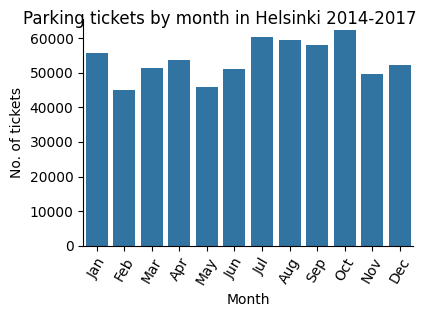

In [51]:
# Rename Months
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'] 

MonthPlot = sns.FacetGrid(pd.DataFrame(df.groupby(["Month"])["Tickets"].count()).reset_index(drop=False), height=3, aspect=1.5)
MonthPlot.map_dataframe(sns.barplot, x='Month', y='Tickets')
MonthPlot.set_xticklabels(months)
MonthPlot.set_xticklabels(rotation = 60)
#MonthPlot.set_titles(col_template="{col_name}", row_template="{row_name}")
MonthPlot.set_axis_labels("Month", "No. of tickets")
#MonthPlot.tight_layout(pad=2.0)
#MonthPlot.fig.subplots_adjust(top=0.95) # adjust the Figure in rp
MonthPlot.fig.suptitle('Parking tickets by month in Helsinki 2014-2017')


# Monthly barchart by fine type

In [52]:
# Seaborne requires data in the format as specified below
# where data is aggregated as a count of "IncidntNum" in data frame grouped by "Category" and "Day" 
# (in the case of weekdays) and the index is reset
pd.DataFrame(df.groupby(["Fine type", "Month"])["Tickets"].count()).reset_index(drop=False)

,Fine type,Month,Tickets
0,Huomautus,Elokuu,2855
1,Huomautus,Heinäkuu,2524
2,Huomautus,Helmikuu,2152
3,Huomautus,Huhtikuu,2016
4,Huomautus,Joulukuu,2538
5,Huomautus,Kesäkuu,2067
6,Huomautus,Lokakuu,2975
7,Huomautus,Maaliskuu,2143
8,Huomautus,Marraskuu,2910
9,Huomautus,Syyskuu,3289


Text(0.5, 0.98, 'Parking tickets by month in Helsinki 2014-2017')

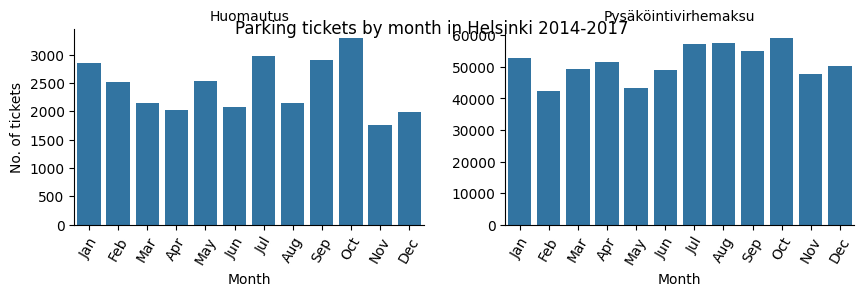

In [53]:
# Rename Months
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'] 

MonthPlot = sns.FacetGrid(pd.DataFrame(df.groupby(["Fine type", "Month"])["Tickets"].count()).reset_index(drop=False), col='Fine type',sharex=False, sharey=False, height=3, aspect=1.5)
MonthPlot.map_dataframe(sns.barplot, x='Month', y='Tickets')
MonthPlot.set_xticklabels(months)
MonthPlot.set_xticklabels(rotation = 60)
MonthPlot.set_titles(col_template="{col_name}", row_template="{row_name}")
MonthPlot.set_axis_labels("Month", "No. of tickets")
MonthPlot.tight_layout(pad=2.0)
MonthPlot.fig.subplots_adjust(top=0.95) # adjust the Figure in rp
MonthPlot.fig.suptitle('Parking tickets by month in Helsinki 2014-2017')

# Monthly bar chart for every postal code

In [57]:
# number tickets without information of the postal code
df[df['Postal code'] == ""].count()

Tickets                89133
Month                  89133
Year                   89133
Address                86171
Fine type              89133
Type of offence        89111
Fine issuer            89133
y                          0
x                          0
Postal code            89133
Postal district            0
Area                       0
Municipality               0
Municipality number        0
Month number           89133
dtype: int64

In [58]:
pd.DataFrame(df.groupby(["Postal code", "Month"])["Tickets"].count()).reset_index(drop=False)

,Postal code,Month,Tickets
0,,Elokuu,15841
1,,Heinäkuu,11117
2,,Helmikuu,179
3,,Huhtikuu,144
4,,Joulukuu,13458
...,...,...,...
988,01260,Marraskuu,3
989,01260,Tammikuu,2
990,01260,Toukokuu,2
991,01420,Kesäkuu,1


Text(0.5, 0.98, 'Parking tickets by month for postal codes in Helsinki 2014-2017')

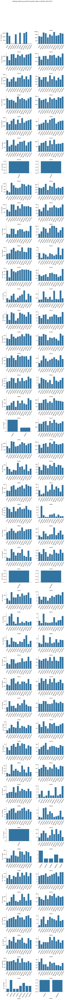

In [59]:
# Rename Months
#months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'] 
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'] 

MonthPlot = sns.FacetGrid(pd.DataFrame(df.groupby(["Postal code", "Month"])["Tickets"].count()).reset_index(drop=False), col='Postal code', sharex=False, sharey=False, col_wrap=2, height=3, aspect=1.5)
MonthPlot.map_dataframe(sns.barplot, x='Month', y='Tickets')
#MonthPlot.set_xticklabels(months)
MonthPlot.set_xticklabels(rotation = 60)
MonthPlot.set_titles(col_template="{col_name}", row_template="{row_name}")
MonthPlot.set_axis_labels("Month", "No. of tickets")
MonthPlot.tight_layout(pad=2.0)
MonthPlot.fig.subplots_adjust(top=0.95) # adjust the Figure in rp
MonthPlot.fig.suptitle('Parking tickets by month for postal codes in Helsinki 2014-2017')

# Map


In [60]:
# shape file could be found from here:
# https://kartta.paikkatietoikkuna.fi/?lang=fi
# https://www.stat.fi/org/avoindata/paikkatietoaineistot/paavo.html

# however I could not find the shape file, maybe we could use help from TA

In [61]:
# downloading the Helsinki District shape-files
# contains information about the coordinates of the boundaries of the residental areas of Helsinki

with urlopen('https://www.stat.fi/org/avoindata/paikkatietoaineistot/paavo.html') as response:
    residential_areas = json.load(response)

residential_areas["features"][0]

HTTPError: HTTP Error 403: Forbidden

In [ ]:
# creating mapping between dataframe and shapefiles using dict
# the dict will have the residental area as a key and as a corresponding value

postal_code_id_map = {}
for feature in residential_areas["features"]:
    feature['id'] = feature['properties']['DISTRICT']
    residential_id_map[feature['properties']['DISTRICT']] = feature['id']
residential_id_map

In [ ]:
# making new dataframe df_ra(df_residential_areas) where 
# we have collected car thefts that happened in different residential areas
df_ra = df['Postal code'].value_counts()
df_ra

#forming pandas dataframe with right column names
df_ra = pd.DataFrame(df_ra.items(), columns=['Postal code', 'Amount of tickets'])
df_ra

In [ ]:
# there is some empty values 

In [ ]:
# adding 'id' column for each postal code with the help of the mapping dict we created earlier
# plotly requires an 'id' column, so that the plotting works

df_ra['id'] = df_ra['Postal code'].apply(lambda x: residential_id_map[x])
df_ra

# Basic map

In [62]:
map_df = df.copy()
map_df = map_df.dropna(axis=0, subset=['y','x'])

In [63]:
#tips for the coordinates
#https://automating-gis-processes.github.io/2016/Lesson3-projections.html

#Different datasets can use different map projections which is a systematic transformation of the latitudes and longitudes into a plain surface.
#This dataset uses ETRS-GK25 (EPSG:3879) as a Coordinate Reference System (CRS) and we want to change it into a projection called EPSG:4326 
#in order we can use the coordinates in folium without any problems

#using geopandas to transform geometries to a new coordinate reference system.

import geopandas

gdf = geopandas.GeoDataFrame(
    map_df, geometry=geopandas.points_from_xy(map_df.x, map_df.y))

gdf

,Tickets,Month,Year,Address,Fine type,Type of offence,Fine issuer,y,x,Postal code,Postal district,Area,Municipality,Municipality number,Month number,geometry
3382,3382,Tammikuu,2015,A.I. Virtasen aukio 0,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.676994e+06,2.549798e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,1,POINT (25497975.000 6676994.000)
3383,3383,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,2,POINT (25497972.351 6677029.029)
3384,3384,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,2,POINT (25497972.351 6677029.029)
3385,3385,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0,8,POINT (25497537.000 6674865.000)
3386,3386,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0,8,POINT (25497537.000 6674865.000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644896,644896,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,6,POINT (25500310.000 6682039.000)
644897,644897,Maaliskuu,2014,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,3,POINT (25500310.000 6682039.000)
644898,644898,Marraskuu,2015,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,11,POINT (25500310.000 6682039.000)
644899,644899,Kesäkuu,2017,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,6,POINT (25500310.000 6682039.000)


In [64]:
# orginal dataframe
gdf['geometry'].head()

3382    POINT (25497975.000 6676994.000)
3383    POINT (25497972.351 6677029.029)
3384    POINT (25497972.351 6677029.029)
3385    POINT (25497537.000 6674865.000)
3386    POINT (25497537.000 6674865.000)
Name: geometry, dtype: geometry

In [65]:
# Define the orginal Coordinate Reference System
gdf.crs = "EPSG:3879"

In [66]:
# Let's take a copy of our layer
data_proj = gdf.copy()

In [67]:
# Reproject the geometries by replacing the values with projected ones
data_proj['geometry'] = data_proj['geometry'].to_crs(epsg=4326)

#data_proj['geometry'] = data_proj['geometry'].to_crs(epsg=3879)

In [68]:
# we notice that the coordinates have changed from the orginal dataframe
data_proj['geometry'].head()

3382    POINT (24.96348 60.20572)
3383    POINT (24.96343 60.20604)
3384    POINT (24.96343 60.20604)
3385    POINT (24.95561 60.18661)
3386    POINT (24.95561 60.18661)
Name: geometry, dtype: geometry

In [69]:
data_proj

,Tickets,Month,Year,Address,Fine type,Type of offence,Fine issuer,y,x,Postal code,Postal district,Area,Municipality,Municipality number,Month number,geometry
3382,3382,Tammikuu,2015,A.I. Virtasen aukio 0,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.676994e+06,2.549798e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,1,POINT (24.96348 60.20572)
3383,3383,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,2,POINT (24.96343 60.20604)
3384,3384,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,2,POINT (24.96343 60.20604)
3385,3385,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0,8,POINT (24.95561 60.18661)
3386,3386,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0,8,POINT (24.95561 60.18661)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644896,644896,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,6,POINT (25.00560 60.25101)
644897,644897,Maaliskuu,2014,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,3,POINT (25.00560 60.25101)
644898,644898,Marraskuu,2015,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,11,POINT (25.00560 60.25101)
644899,644899,Kesäkuu,2017,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,6,POINT (25.00560 60.25101)


In [70]:
data_proj['Year']

3382      2015
3383      2014
3384      2014
3385      2014
3386      2014
          ... 
644896    2014
644897    2014
644898    2015
644899    2017
644900    2017
Name: Year, Length: 555768, dtype: int64

In [71]:
# making a copy of the dataset with right coordinates
map_df_projected = data_proj.copy()

In [72]:
# Taking only 2014 from the dataset
map_df_projected = map_df_projected[map_df_projected['Year'] == 2014]
map_df_projected

,Tickets,Month,Year,Address,Fine type,Type of offence,Fine issuer,y,x,Postal code,Postal district,Area,Municipality,Municipality number,Month number,geometry
3383,3383,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,2,POINT (24.96343 60.20604)
3384,3384,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,2,POINT (24.96343 60.20604)
3385,3385,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0,8,POINT (24.95561 60.18661)
3386,3386,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0,8,POINT (24.95561 60.18661)
3387,3387,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0,8,POINT (24.95561 60.18661)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644884,644884,Elokuu,2014,Örskintie 3,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.682040e+06,2.550039e+07,00700,HELSINKI,Malmi,Helsinki,91.0,8,POINT (25.00701 60.25102)
644888,644888,Marraskuu,2014,Örskintie 4,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.681933e+06,2.550032e+07,00700,HELSINKI,Malmi,Helsinki,91.0,11,POINT (25.00587 60.25006)
644895,644895,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,6,POINT (25.00560 60.25101)
644896,644896,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,6,POINT (25.00560 60.25101)


In [73]:
# Taking only january from the dataset
map_df_projected = map_df_projected[map_df_projected['Month'] == "Tammikuu"]
map_df_projected

,Tickets,Month,Year,Address,Fine type,Type of offence,Fine issuer,y,x,Postal code,Postal district,Area,Municipality,Municipality number,Month number,geometry
3777,3777,Tammikuu,2014,Aamuruskontie 1,Pysäköintivirhemaksu,2104 Muuta liikennettä haittaava pysäköinti,Pysäköinnintarkastaja,6685768.0,25501582.0,00750,HELSINKI,Puistola,Helsinki,91.0,1,POINT (25.02860 60.28448)
3864,3864,Tammikuu,2014,Aarrekuja 1,Pysäköintivirhemaksu,0400 Pysäköintikieltoalue liikennemerkin nouda...,Pysäköinnintarkastaja,6680719.0,25505566.0,00940,HELSINKI,Kontula,Helsinki,91.0,1,POINT (25.10048 60.23912)
3883,3883,Tammikuu,2014,Aarteenetsijänkuja 1,Pysäköintivirhemaksu,1501 Pysäköinti jalkakäytävälle,Pysäköinnintarkastaja,6680624.0,25505512.0,00940,HELSINKI,Kontula,Helsinki,91.0,1,POINT (25.09950 60.23827)
3911,3911,Tammikuu,2014,Aarteenetsijänkuja 2,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6680612.0,25505607.0,00970,HELSINKI,Mellunkylä,Helsinki,91.0,1,POINT (25.10121 60.23816)
4011,4011,Tammikuu,2014,Aarteenetsijäntie 8,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6680612.0,25505607.0,00970,HELSINKI,Mellunkylä,Helsinki,91.0,1,POINT (25.10121 60.23816)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644680,644680,Tammikuu,2014,Ässänrinne 4,Pysäköintivirhemaksu,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6674438.0,25497528.0,00530,HELSINKI,Kallio,Helsinki,91.0,1,POINT (24.95545 60.18278)
644805,644805,Tammikuu,2014,Örskintie 1,Pysäköintivirhemaksu,0401 Pysäköintikieltoalue liikennemerkin nouda...,Pysäköinnintarkastaja,6681967.0,25500411.0,00700,HELSINKI,Malmi,Helsinki,91.0,1,POINT (25.00742 60.25036)
644867,644867,Tammikuu,2014,Örskintie 2,Pysäköintivirhemaksu,0400 Pysäköintikieltoalue liikennemerkin nouda...,Pysäköinnintarkastaja,6681900.0,25500351.0,00700,HELSINKI,Malmi,Helsinki,91.0,1,POINT (25.00634 60.24976)
644868,644868,Tammikuu,2014,Örskintie 2,Pysäköintivirhemaksu,0401 Pysäköintikieltoalue liikennemerkin nouda...,Pysäköinnintarkastaja,6681900.0,25500351.0,00700,HELSINKI,Malmi,Helsinki,91.0,1,POINT (25.00634 60.24976)


In [74]:
# parking tickets in january 2014 in Helsinki

import folium

# creating the map
map_helsinki = folium.Map([60.192059, 24.945831], zoom_start=12, tiles = "CartoDB Positron")

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in map_df_projected.geometry]

for coordinates in geo_df_list:
    #print(df.iloc[i]['X'])
    #print(df.iloc[i]['Y'])
    folium.CircleMarker(
      location=coordinates,
      radius=2,
      color='red',
      fill=True,
      fill_color='crimson'
      
    ).add_to(map_helsinki) 

# plotting
map_helsinki

# Heat map

In [75]:
# parking tickets in january 2014 in Helsinki

from folium.plugins import HeatMap
from folium import plugins

# creating the map
heat_map_helsinki = folium.Map([60.192059, 24.945831], zoom_start=12, tiles = "CartoDB Positron")

heat_data = [[point.xy[1][0], point.xy[0][0]] for point in map_df_projected.geometry]

plugins.HeatMap(heat_data).add_to(heat_map_helsinki)

# Display the map
heat_map_helsinki

A walk-through of your preliminary data-analysis, addressing
What is the total size of your data? (MB, number of rows, number of variables, etc)
What are other properties? (What is the date range? Is is it geo-data?, then a quick plot of locations, etc.)
Show the fundamental distributions of the data (similar to the work we did on SF crime data for lecture 3)


Our dataset describes the parkin tickets in Helsinki between 2014 and 2017
The total size of the data is 644900 rows including basic information such as year, month, address and coordinates of the parking ticket. In addition, fine issuer, postal code, postal district area, municipality and municipality number are included.
All in all there is 13 columns in the dataset.









# Heat Map with time

In [ ]:
heat_time_df = data_proj.copy()

In [ ]:
from folium import plugins

# creating the map
heat_map_time_helsinki = folium.Map([60.192059, 24.945831], zoom_start=13, tiles = "CartoDB Positron") 

heat_time_df[['Y', 'X']] = [[point.xy[1][0], point.xy[0][0]] for point in data_proj_time.geometry]

# Create weight column, using date
heat_time_df['Weight'] = data_proj_time['Month number']
heat_time_df['Weight'] = heat_time_df['Weight'].astype(float)

heat_time_df = heat_time_df.dropna(axis=0, subset=['Y','X', 'Weight'])

# List comprehension to make out list of lists
heat_time_data = [[[row['Y'],row['X']] for index, row in heat_time_df[heat_time_df['Weight'] == i].iterrows()] for i in range(0,13)]

# Plot it on the map
hm = plugins.HeatMapWithTime(heat_time_data,auto_play=True,max_opacity=0.8)
hm.add_to(heat_map_time_helsinki)

# Display the map
heat_map_time_helsinki

# Fundamental distributions of the data

In [80]:
# copying data for the histogram
HistData = data.copy()
HistData

,Virheen tekokuukausi,Virheen tekovuosi,Osoite,Virhemaksun vaihe,Virheen pääluokka / pääsyy,Virheen kirjaaja,y,x,Postinumero,Postitoimipaikka,Alue,Kunta,Kunta_nro
0,Elokuu,2016,NaN,Pysäköintivirhemaksu,1700 Luvaton maastopysäköinti,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
1,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
2,Elokuu,2016,NaN,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
3,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
4,Elokuu,2016,NaN,Pysäköintivirhemaksu,1300 Pysäköinti/Pysäyttäminen suojatielle/5 m ...,Poliisi,NaN,NaN,,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
644896,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0
644897,Maaliskuu,2014,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0
644898,Marraskuu,2015,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0
644899,Kesäkuu,2017,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6682039.0,25500310.0,00700,HELSINKI,Malmi,Helsinki,91.0


In [83]:
HistData = HistData.dropna(axis=0, subset=['y','x'])
HistData

,Virheen tekokuukausi,Virheen tekovuosi,Osoite,Virhemaksun vaihe,Virheen pääluokka / pääsyy,Virheen kirjaaja,y,x,Postinumero,Postitoimipaikka,Alue,Kunta,Kunta_nro
3382,Tammikuu,2015,A.I. Virtasen aukio 0,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.676994e+06,2.549798e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0
3383,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0
3384,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0
3385,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0
3386,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
644896,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0
644897,Maaliskuu,2014,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0
644898,Marraskuu,2015,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0
644899,Kesäkuu,2017,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0


In [94]:
import numpy as np

hist, bins =np.histogram(HistData["y"], bins=50, range=None, normed=None, weights=None, density=None)

TypeError: histogram() got an unexpected keyword argument 'normed'

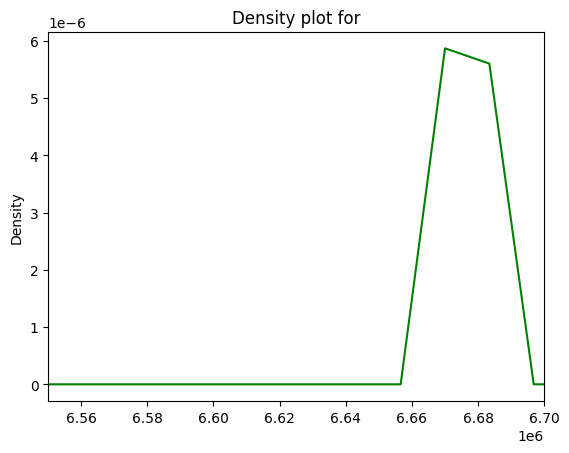

In [92]:
import matplotlib.pyplot as plt

pyplot.hist(HistData['y'], bins, alpha=0.5, label='')
pyplot.legend(loc='upper right')
pyplot.xlabel("Latitude")
pyplot.ylabel("Latitude")
pyplot.show()

In [ ]:
HistData.y.plot.kde(color='green')
plt.title('Density plot for')
plt.xlim(6550000, 6700000)
plt.show()

# Top adresses to get ticket

In [103]:
df_top = df.dropna(axis=0, subset=['y','x'])
df_top

,Tickets,Month,Year,Address,Fine type,Type of offence,Fine issuer,y,x,Postal code,Postal district,Area,Municipality,Municipality number,Month number
3382,3382,Tammikuu,2015,A.I. Virtasen aukio 0,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.676994e+06,2.549798e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,1
3383,3383,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,2
3384,3384,Helmikuu,2014,A.I.Virtasen aukio 1,Pysäköintivirhemaksu,0300 Pysäköinti kielletty liikennemerkin nouda...,Pysäköinnintarkastaja,6.677029e+06,2.549797e+07,00560,HELSINKI,Toukola-Vanhakaupunk,Helsinki,91.0,2
3385,3385,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0,8
3386,3386,Elokuu,2014,Aadolfinkatu 10,Huomautus,0601 pysäköinti ilman p-tunnusta/p-laitetta/p-...,Pysäköinnintarkastaja,6.674865e+06,2.549754e+07,00500,HELSINKI,Sörnäinen,Helsinki,91.0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644896,644896,Kesäkuu,2014,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,6
644897,644897,Maaliskuu,2014,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,3
644898,644898,Marraskuu,2015,Örskintie 6,Pysäköintivirhemaksu,2301 Pysäköinti ilman pysäköintikiekkoa,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,11
644899,644899,Kesäkuu,2017,Örskintie 6,Pysäköintivirhemaksu,0905 Sallitun pysäköintiajan ylitys kiekkopaik...,Pysäköinnintarkastaja,6.682039e+06,2.550031e+07,00700,HELSINKI,Malmi,Helsinki,91.0,6


In [105]:
df_top['Address'].value_counts()

Mäntymäenkenttä 0     7098
Haartmaninkatu 4      6208
Kalliosaarenkuja 1    4723
Salomonkatu 19        2650
Töölöntori 0          2637
                      ... 
Nummitie 11              1
Nummitie 1               1
Nukkeruusunkuja 3        1
Nuijamiestentie 30       1
Örskintie 9              1
Name: Address, Length: 16530, dtype: int64

# Plot for the postal codes

<AxesSubplot: title={'center': 'Ticket occurrences in each category'}, xlabel='Area', ylabel='Occurrences'>

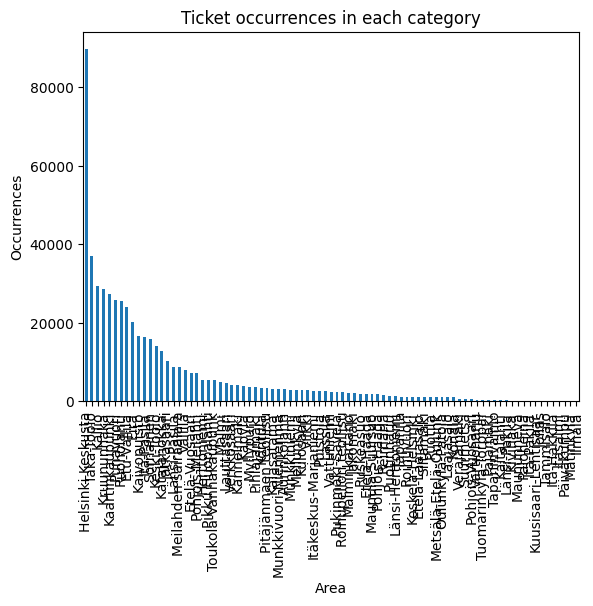

In [117]:
df_top['Area'].value_counts().plot.bar(title='Ticket occurrences in each category', xlabel='Area', ylabel='Occurrences')